In [1]:
import numpy as np
from PIL import Image 
import string
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import
from IPython.display import display # to display images

import matplotlib.pyplot as plt
import numpy as np
import base64
from sklearn.cluster import KMeans
import multiprocessing
import IPython

In [2]:
cpu_threads=max(1,multiprocessing.cpu_count()-1)
cpu_threads

23

In [3]:
def treed__pixel_chart(data, text, alpha=0.1):
    print(text)
    fig = plt.figure(figsize=(9,9))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(data[:,0], data[:,1], data[:,2], alpha=alpha, color=data/255.0)

    ax.set_xlabel('Red')
    ax.set_ylabel('Green')
    ax.set_zlabel('Blue')
    ax.set_xlim(0,255)
    ax.set_ylim(0,255)
    ax.set_zlim(0,255)
    plt.show()
    
# treed__pixel_chart(np.take(palette, imgclust, axis=0), 'Pixels 3D chart compressed image', alpha=0.1)

In [4]:
def compress_image(path, palet_len=10, skip_3d_original=False):
    img=Image.open(path)
    pix=img.load()
    display(img)
    print(img.mode, img.size)

    kmean=KMeans(palet_len, n_jobs=cpu_threads)

    # copy pixel data
    data = np.asarray(img.getdata())

    

    if not skip_3d_original:
        treed__pixel_chart(data, 'Pixels 3D chart original image', alpha=0.1)
    
    print("fitting model")
    # fix the kmean
    kmean.fit(data)
    
    # getting pallete from KMean
    palette=np.vectorize(int)(kmean.cluster_centers_)

    print("compressing the image")
    # assig each pixel to cluster
    imgclust=kmean.predict(data)

    # reshape data for easier access in copy process
    treed__pixel_chart(np.take(palette, imgclust, axis=0), 'Pixels 3D chart compressed image '+str(palet_len)+' clusters', alpha=0.1)

    imgclust=imgclust.reshape((img.size[1],img.size[0]))
    palette=[tuple(p)for p in palette]

    palette_height=40

    img_palette=Image.new(img.mode, (palet_len*palette_height, palette_height))
    pix_palette=img_palette.load()

    for x in range(img_palette.size[0]):
        for y in range(img_palette.size[1]):
            pix_palette[x,y]=palette[x//palette_height]
    print("Pallete")
    IPython.display.display(img_palette)
    for x in range(img.size[0]):
        for y in range(img.size[1]):
            pix[x,y]=palette[imgclust[y][x]]


    return img

Loading images

In [5]:
import glob

In [6]:
files = list(glob.glob('./media/*'))
files

['./media/LR-aic-bic.png',
 './media/Screenshot 2024-03-29 102819.png',
 './media/Screenshot 2024-03-29 102902.png',
 './media/Screenshot 2024-03-29 102911.png',
 './media/Screenshot 2024-05-14 152913.png',
 './media/Screenshot 2024-05-14 153022.png',
 './media/Screenshot 2024-05-14 153100.png',
 './media/Screenshot 2024-05-14 153117.png',
 './media/Screenshot 2024-05-14 153140.png',
 './media/Screenshot 2024-05-14 153152.png',
 './media/Screenshot 2024-05-14 153349.png',
 './media/Screenshot 2024-05-14 153410.png',
 './media/Screenshot 2024-05-15 121751.png',
 './media/Screenshot 2024-05-15 121803.png',
 './media/Screenshot 2024-05-15 121815.png']

In [7]:
def load_image(f):
    img=Image.open('media/Screenshot 2024-05-15 121815.png')
    pix=img.load()
    print(img.mode, img.size)
    return img

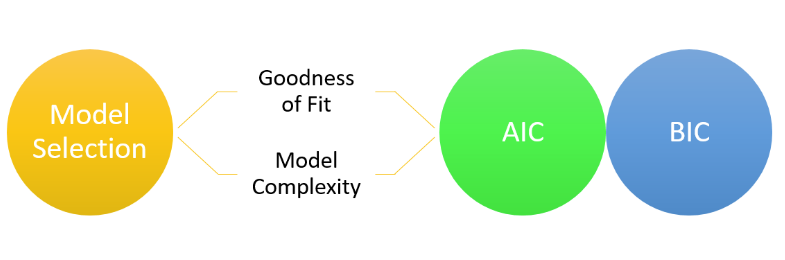

RGBA (785, 260)
fitting model
compressing the image
Pixels 3D chart compressed image 3 clusters


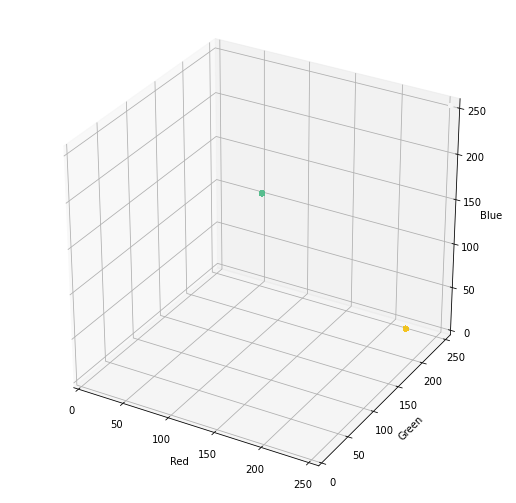

Pallete


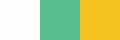

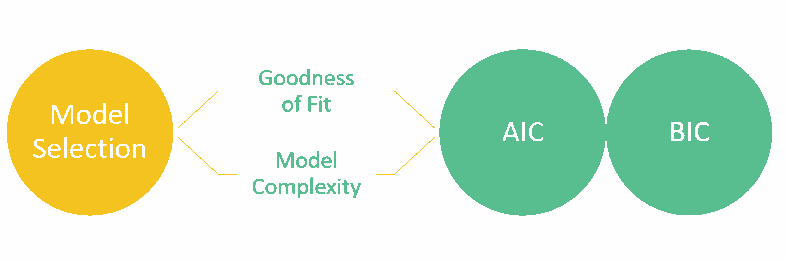

In [8]:
compress_image(files[0], 3, skip_3d_original=True)

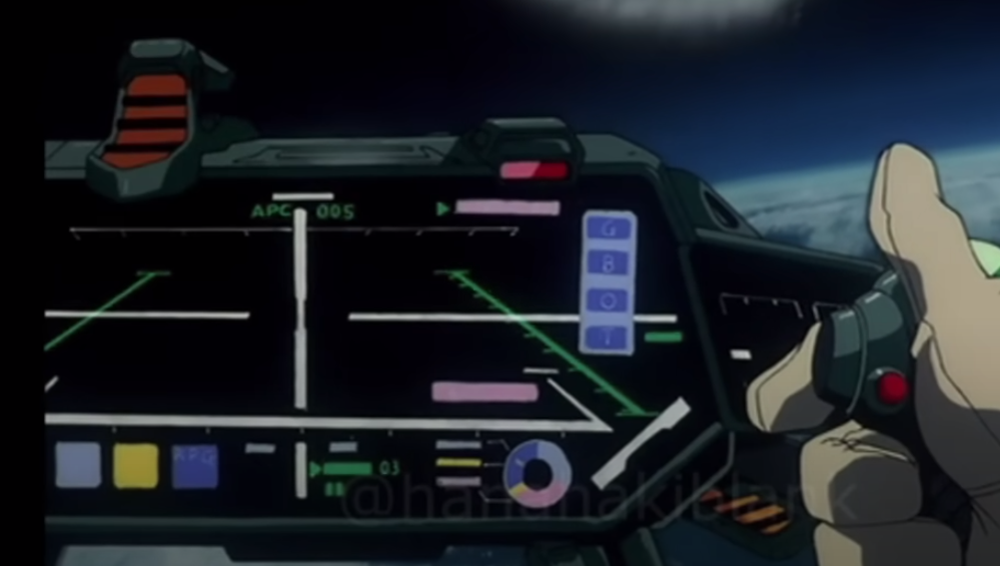

RGBA (1001, 567)
Pixels 3D chart original image


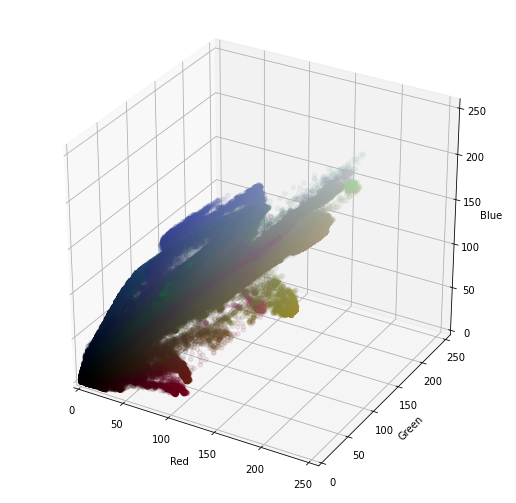

fitting model
compressing the image
Pixels 3D chart compressed image 30 clusters


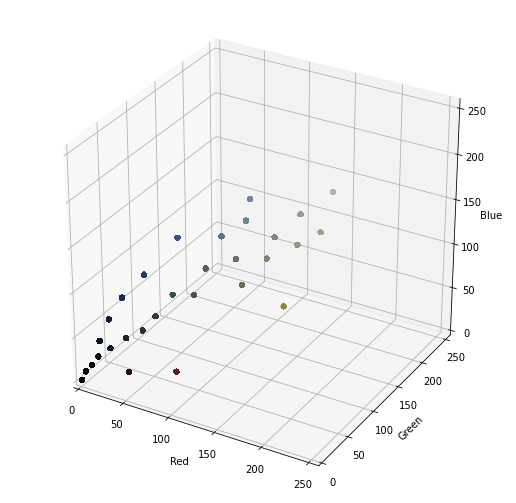

Pallete


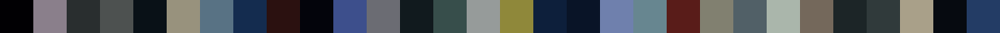

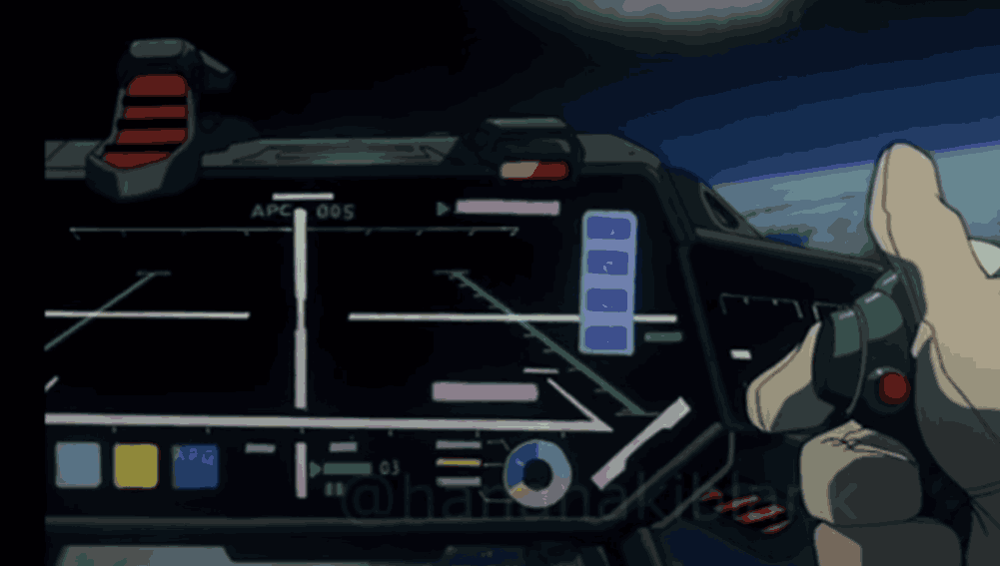

In [9]:
compress_image('./media/Screenshot 2024-05-14 153022.png', 30)

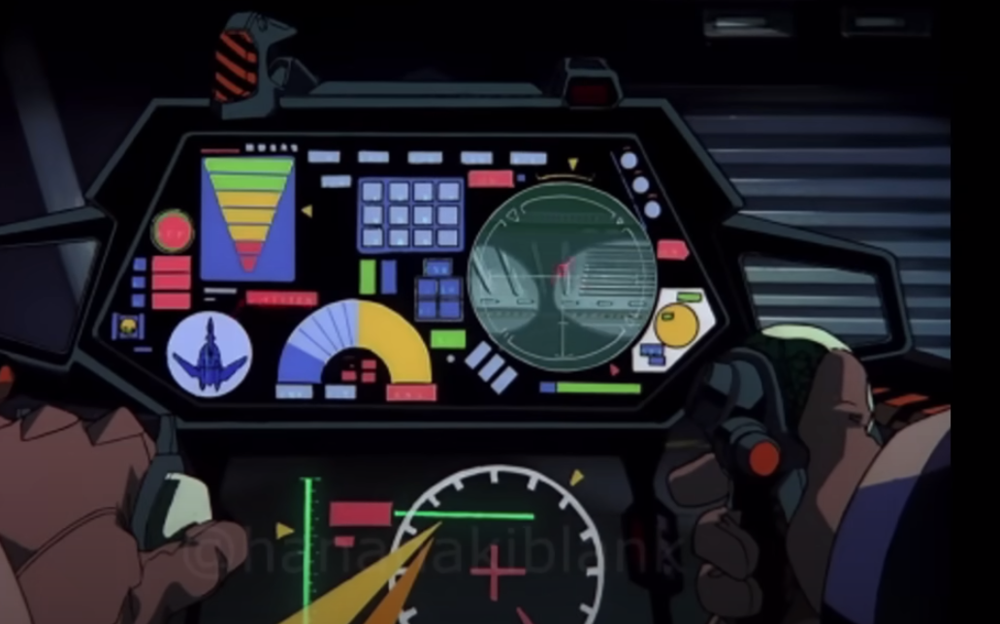

RGBA (1031, 644)
Pixels 3D chart original image


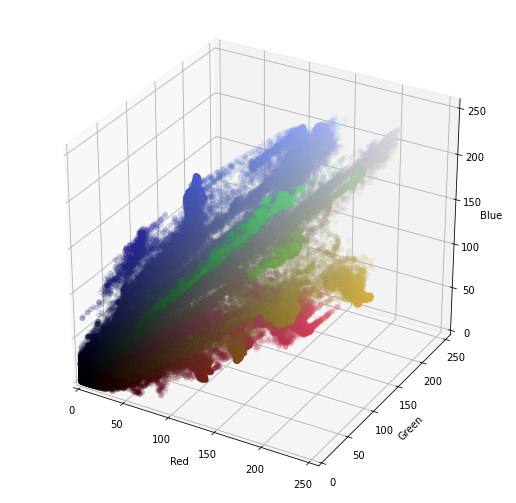

fitting model
compressing the image
Pixels 3D chart compressed image 25 clusters


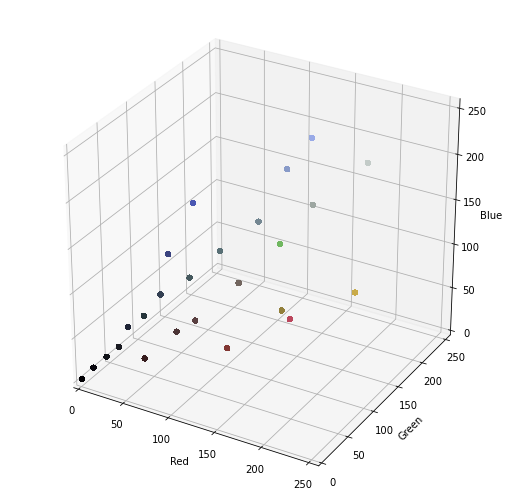

Pallete


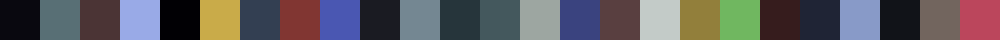

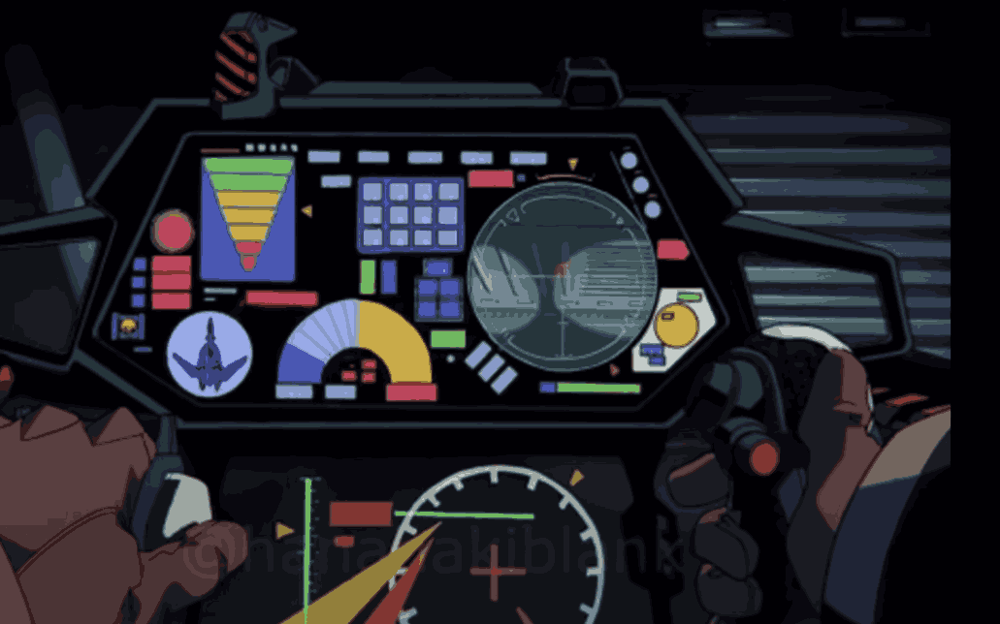

In [10]:
compress_image('./media/Screenshot 2024-05-14 152913.png', 25)

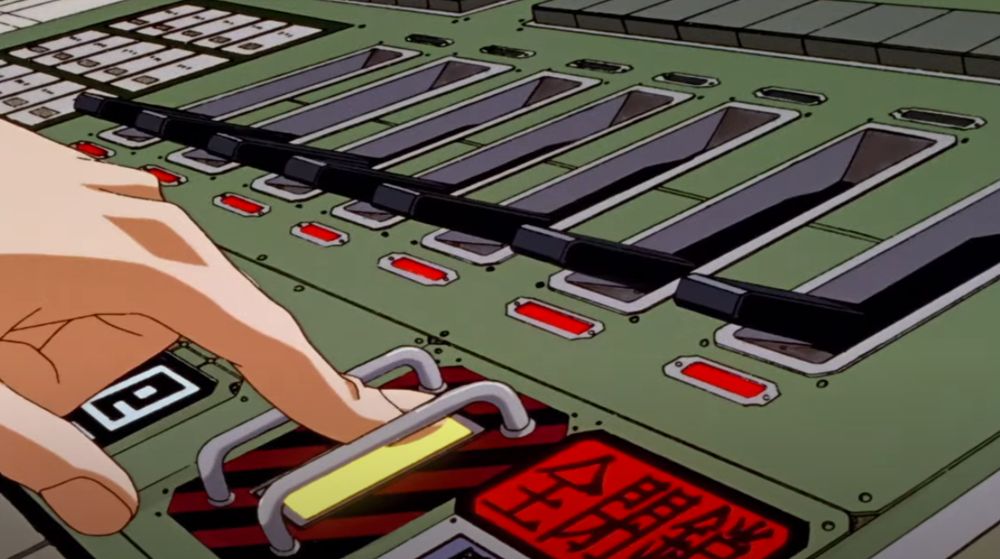

RGBA (1223, 684)
Pixels 3D chart original image


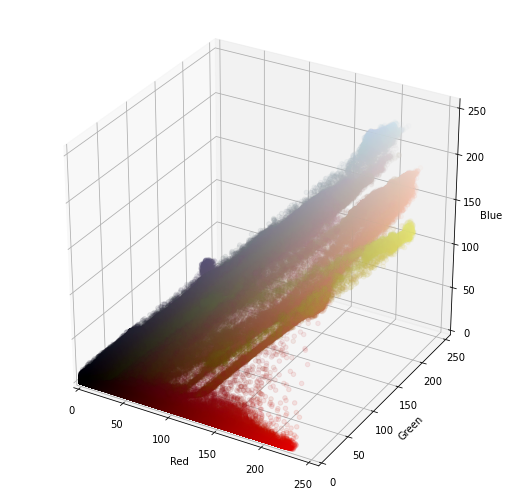

fitting model
compressing the image
Pixels 3D chart compressed image 25 clusters


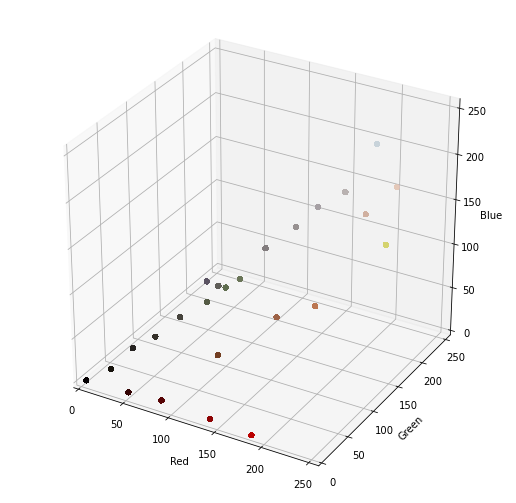

Pallete


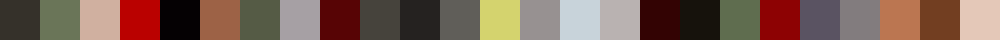

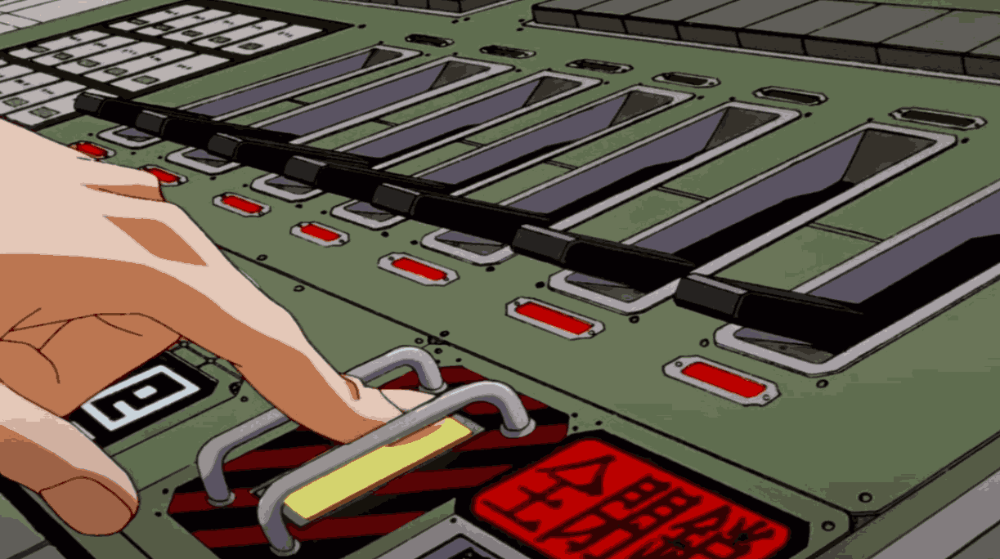

In [11]:
compress_image('./media/Screenshot 2024-05-14 153100.png', 25)

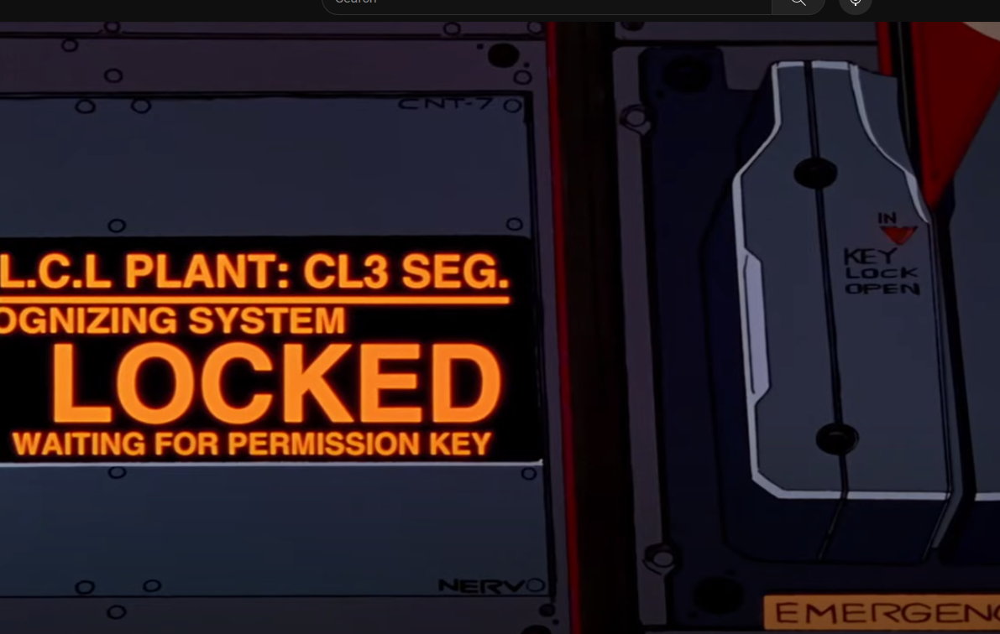

RGBA (1191, 756)
Pixels 3D chart original image


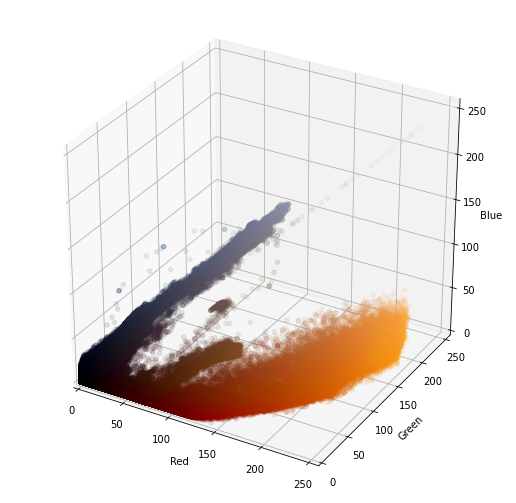

fitting model
compressing the image
Pixels 3D chart compressed image 15 clusters


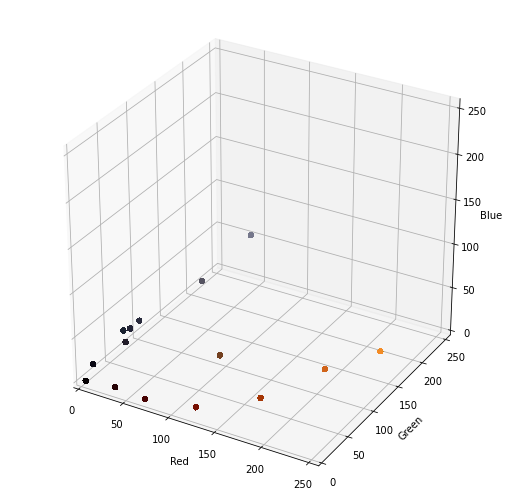

Pallete


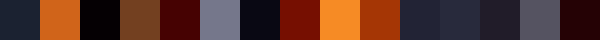

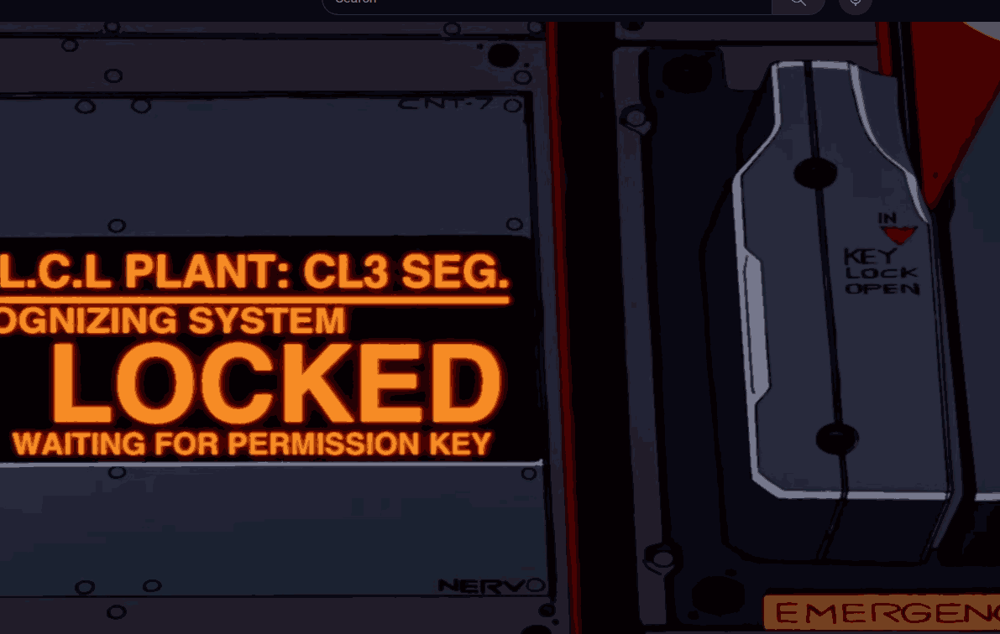

In [12]:
compress_image('./media/Screenshot 2024-05-14 153140.png', 15)

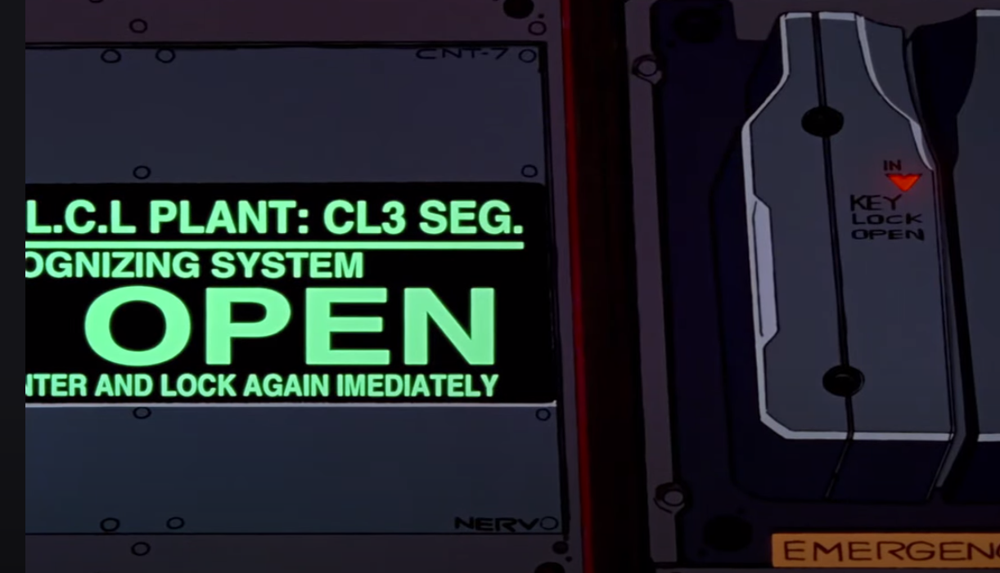

RGBA (1222, 701)
Pixels 3D chart original image


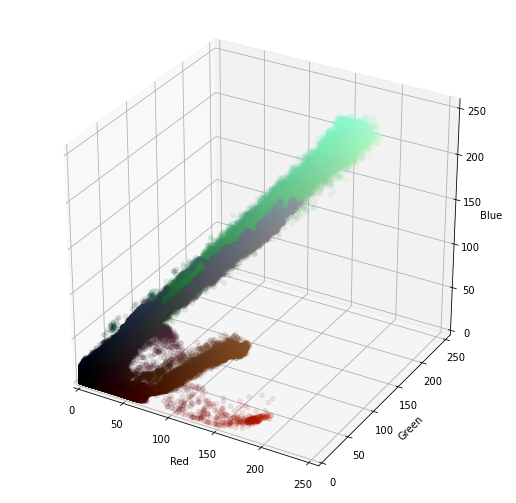

fitting model
compressing the image
Pixels 3D chart compressed image 15 clusters


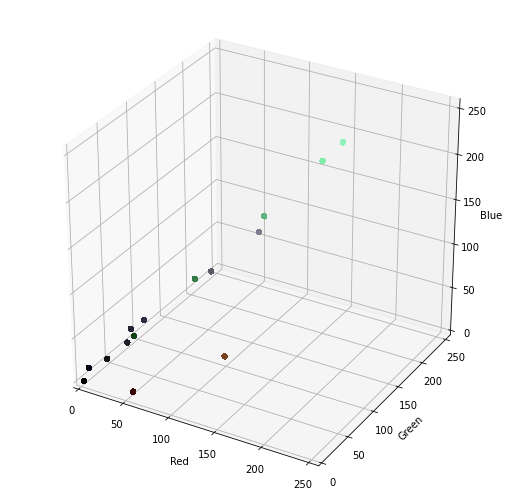

Pallete


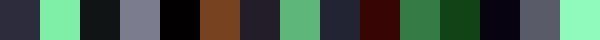

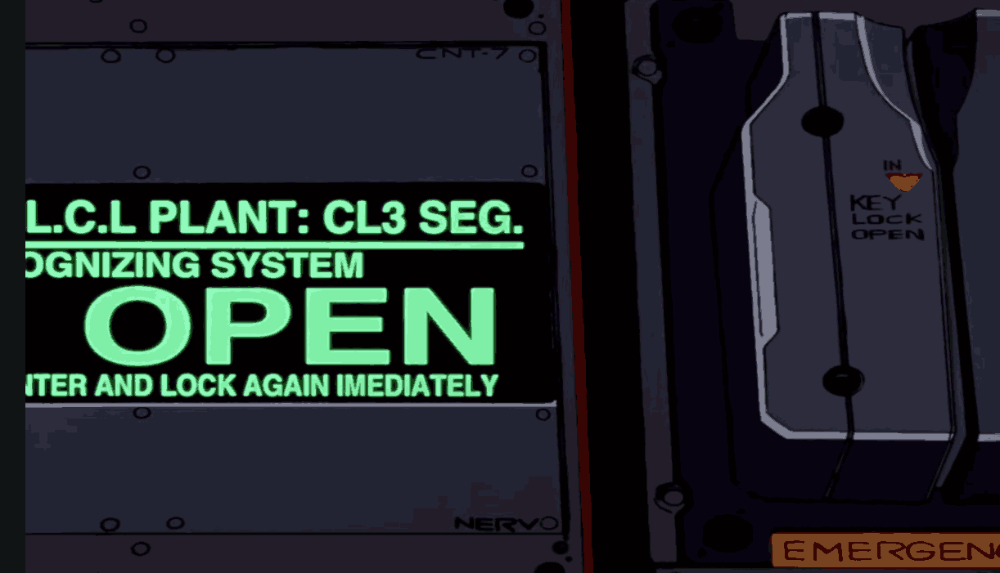

In [13]:
compress_image('./media/Screenshot 2024-05-14 153152.png', 15)

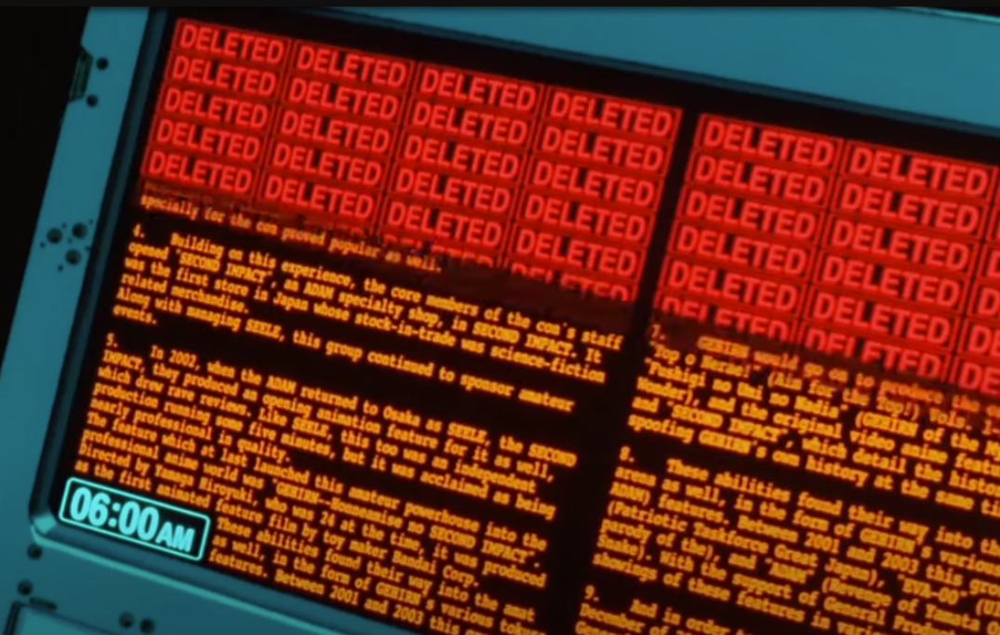

RGBA (1075, 683)
Pixels 3D chart original image


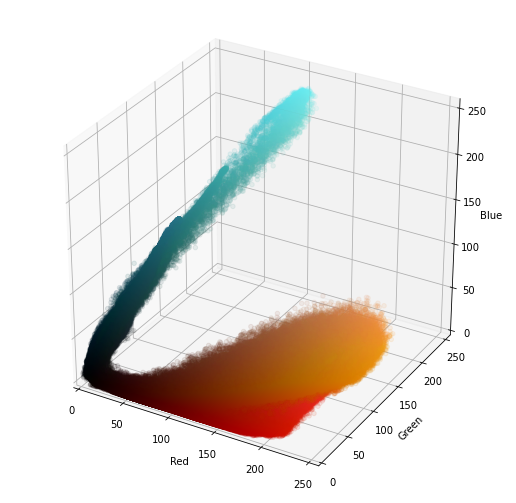

fitting model
compressing the image
Pixels 3D chart compressed image 10 clusters


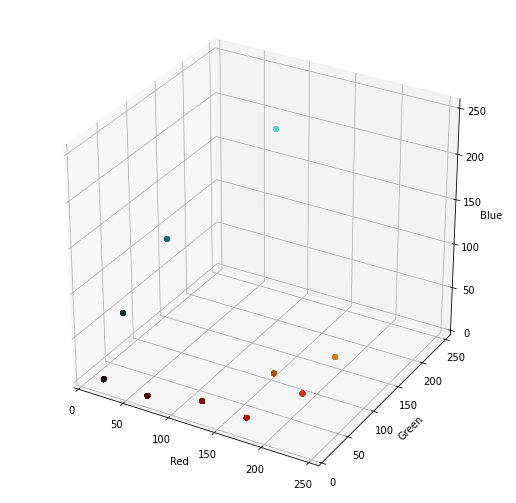

Pallete


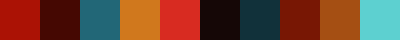

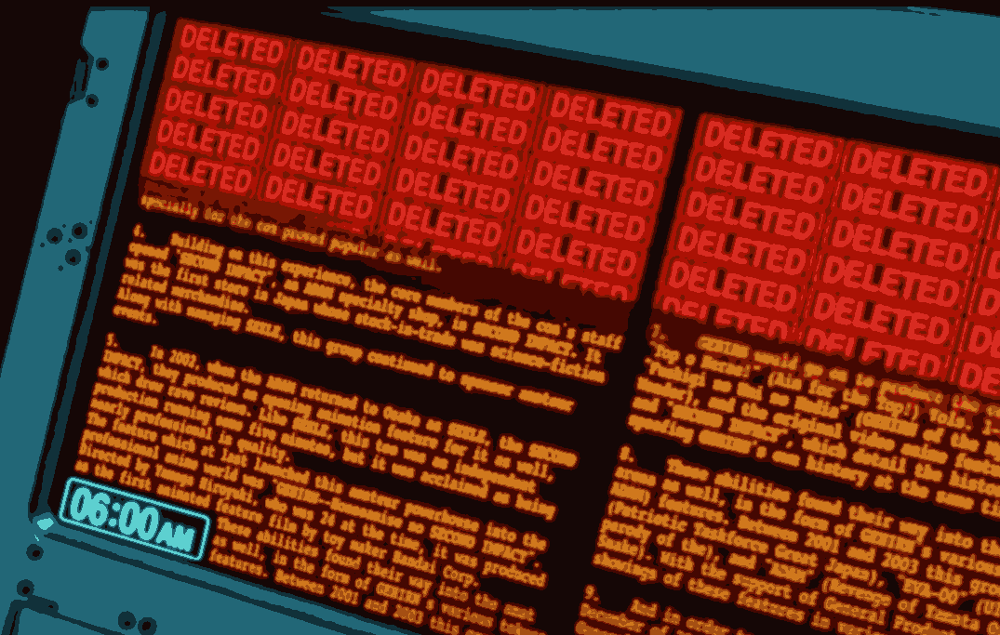

In [14]:
compress_image('./media/Screenshot 2024-05-14 153349.png', 10)

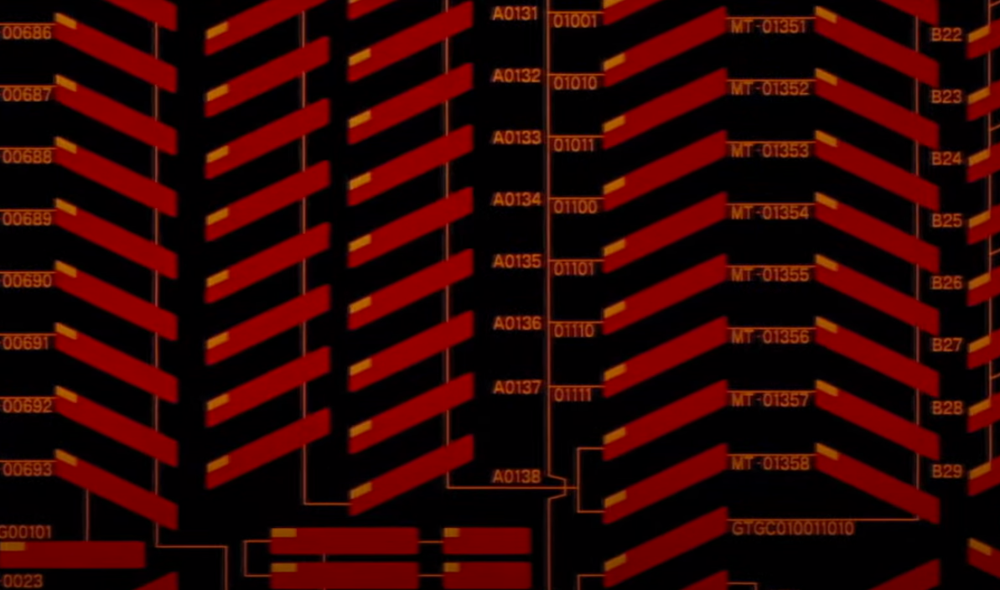

RGBA (1193, 704)
Pixels 3D chart original image


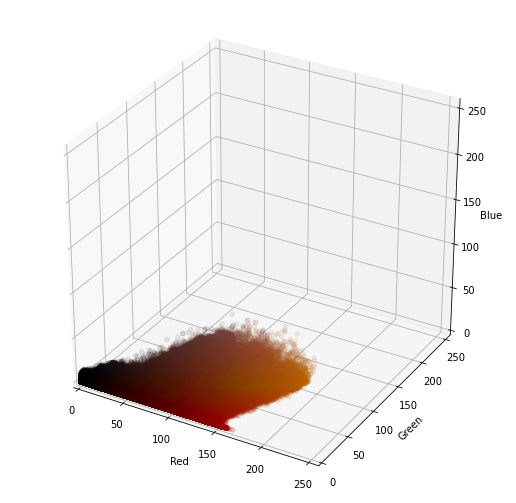

fitting model
compressing the image
Pixels 3D chart compressed image 10 clusters


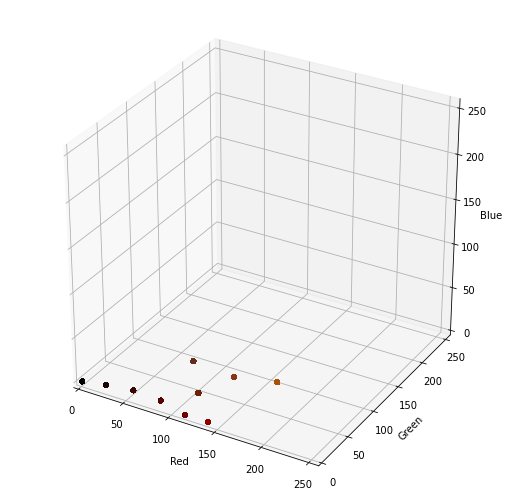

Pallete


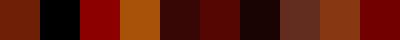

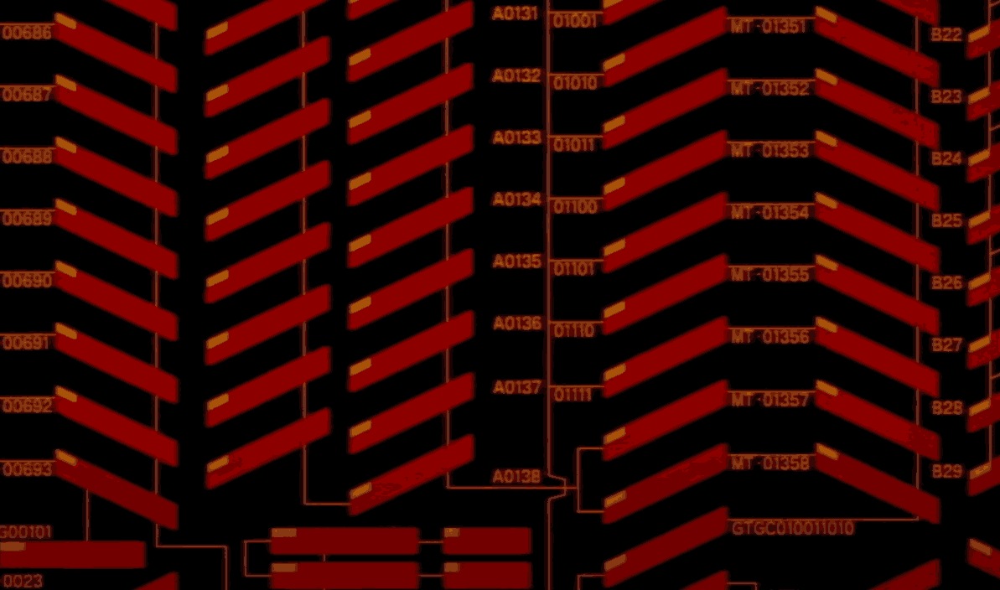

In [26]:
compress_image('./media/Screenshot 2024-05-14 153410.png', 10)

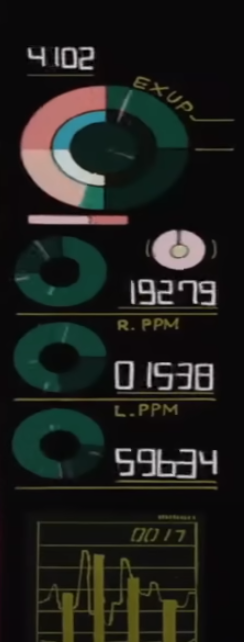

RGBA (244, 642)
Pixels 3D chart original image


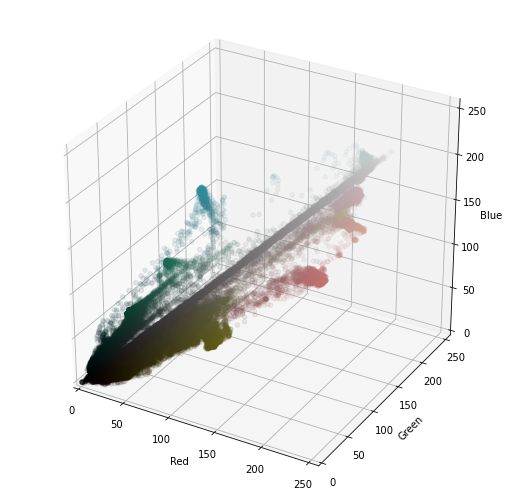

fitting model
compressing the image
Pixels 3D chart compressed image 13 clusters


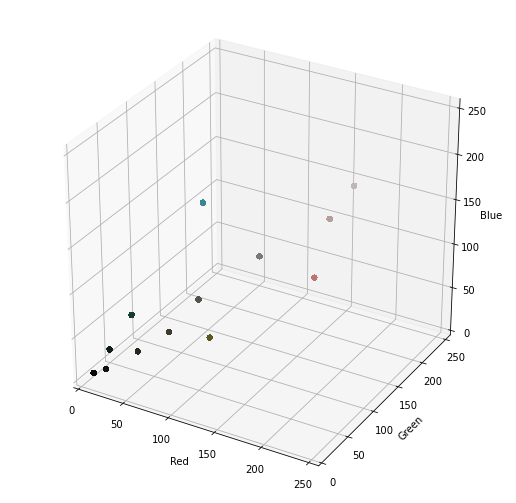

Pallete


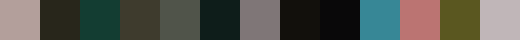

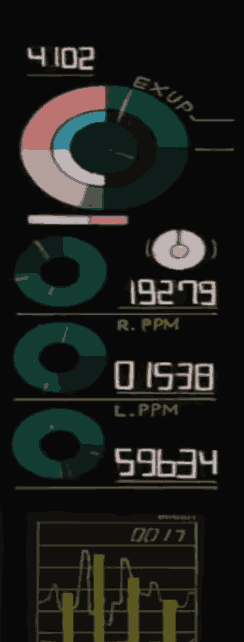

In [25]:
compress_image('./media/Screenshot 2024-05-15 121751.png', 13)

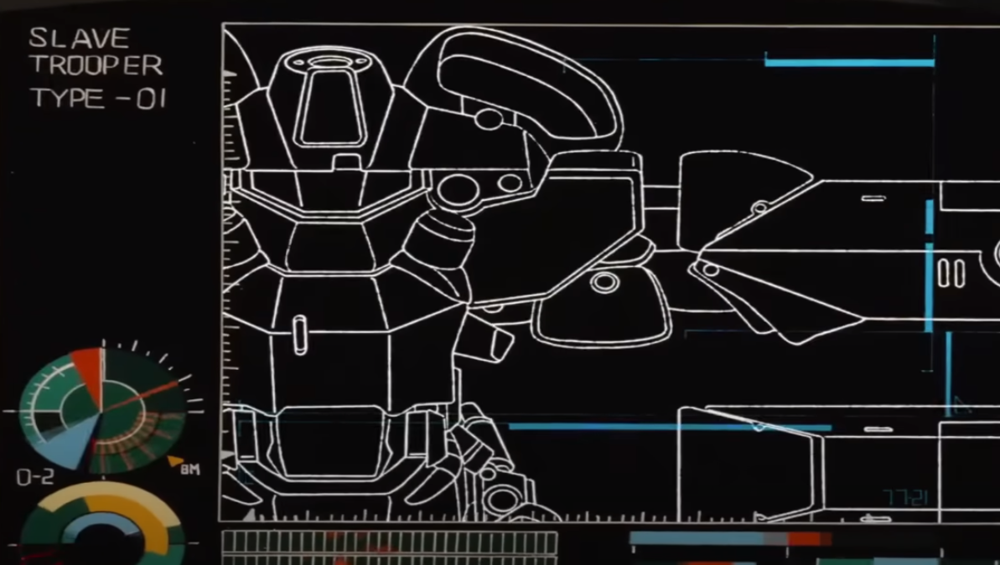

RGBA (1193, 675)
Pixels 3D chart original image


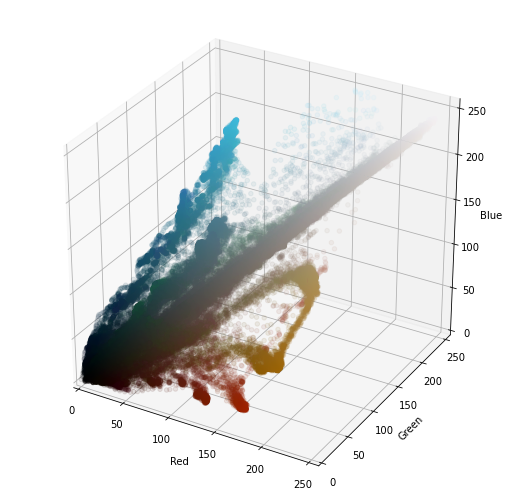

fitting model
compressing the image
Pixels 3D chart compressed image 15 clusters


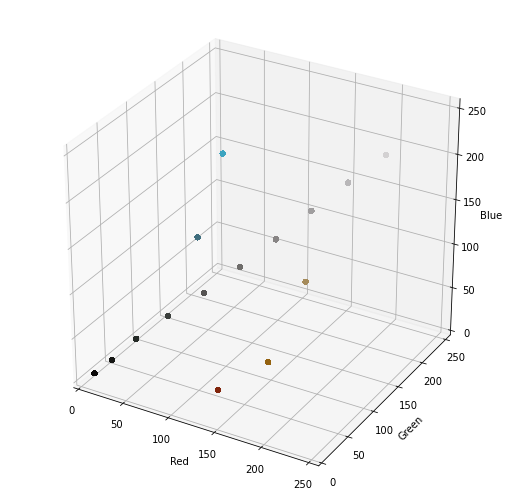

Pallete


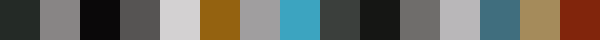

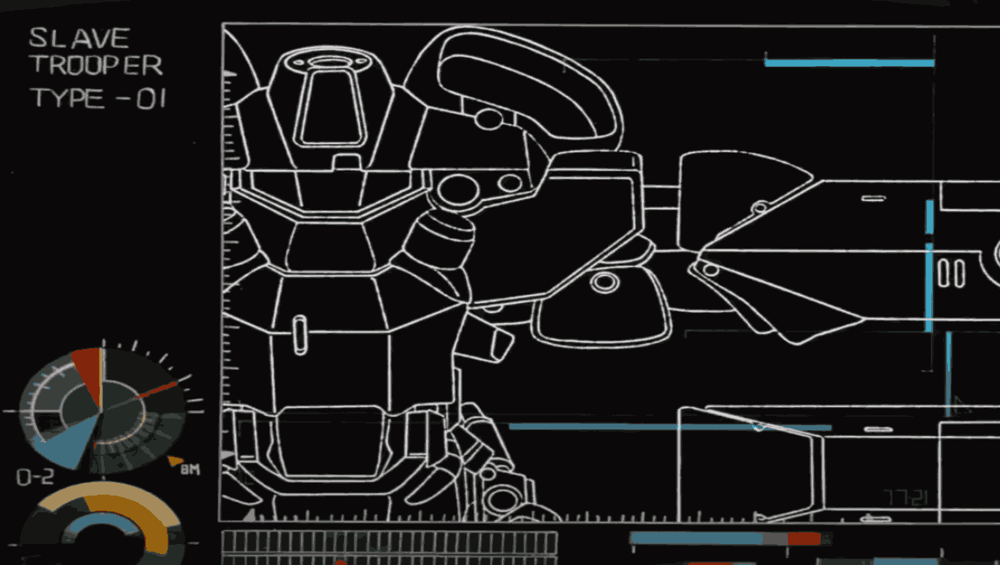

In [21]:
compress_image('./media/Screenshot 2024-05-15 121803.png', 15)

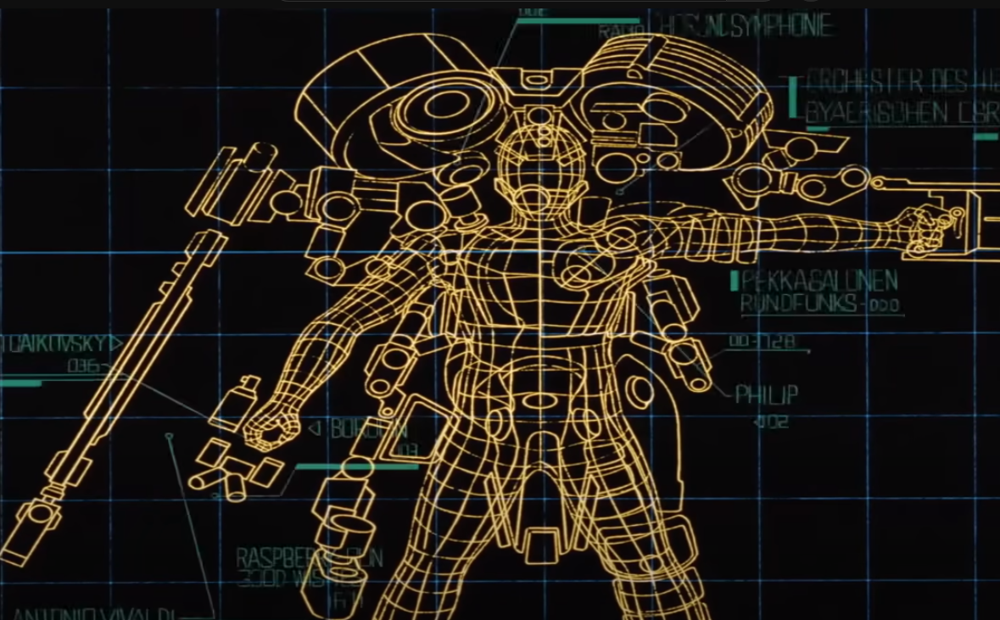

RGBA (1179, 731)
Pixels 3D chart original image


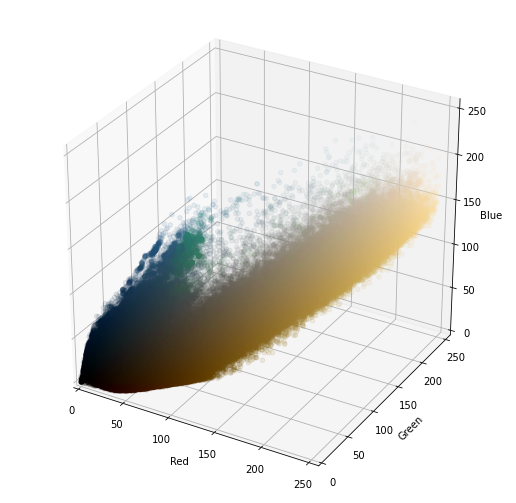

fitting model
compressing the image
Pixels 3D chart compressed image 15 clusters


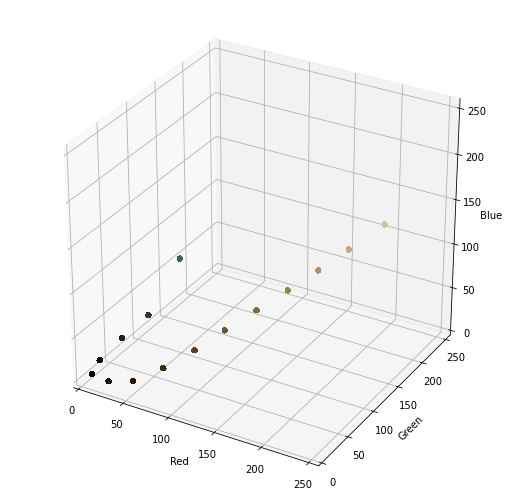

Pallete


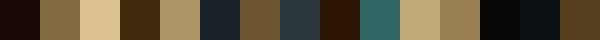

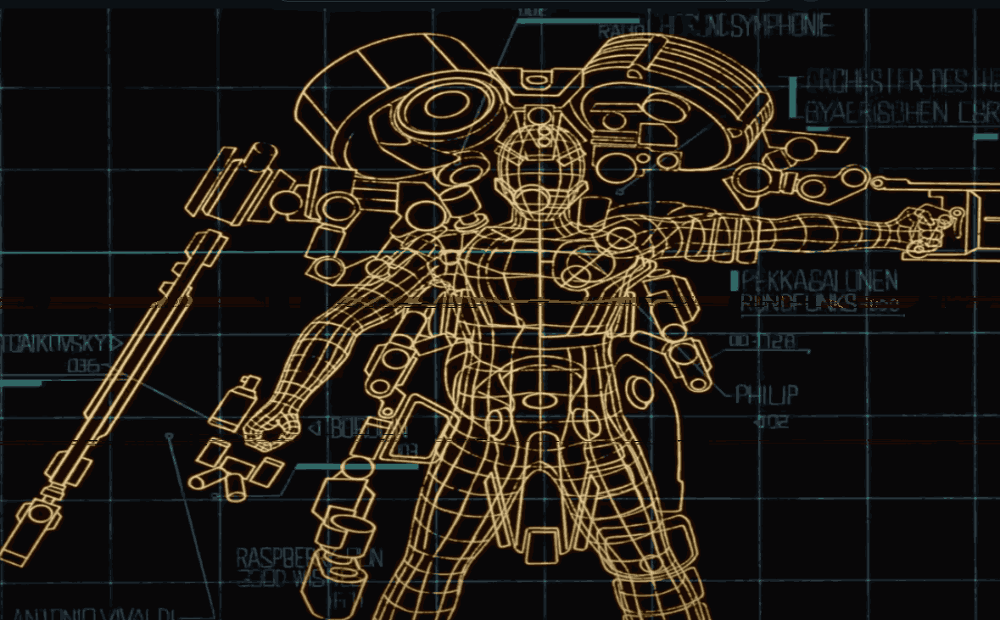

In [27]:
compress_image('./media/Screenshot 2024-05-15 121815.png', 15)

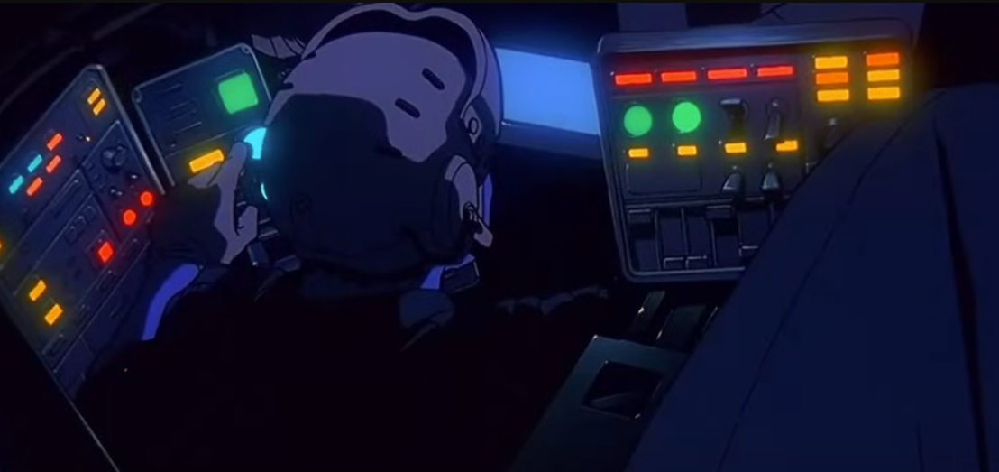

RGBA (1108, 523)
Pixels 3D chart original image


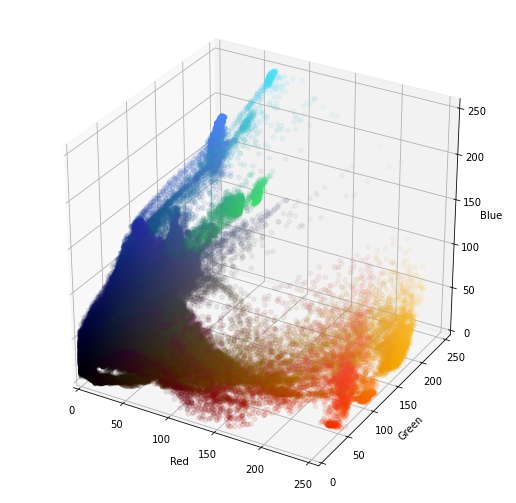

fitting model
compressing the image
Pixels 3D chart compressed image 15 clusters


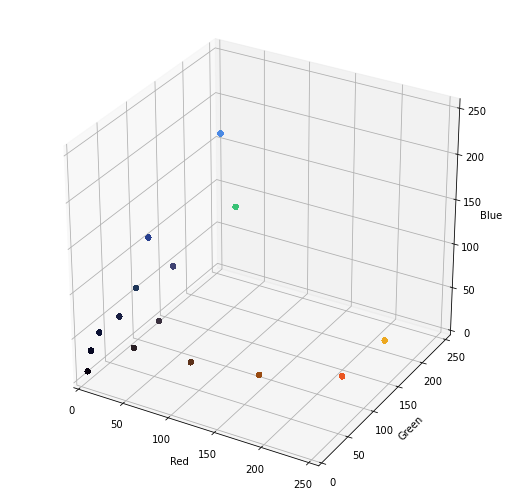

Pallete


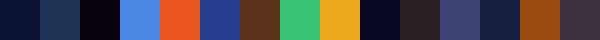

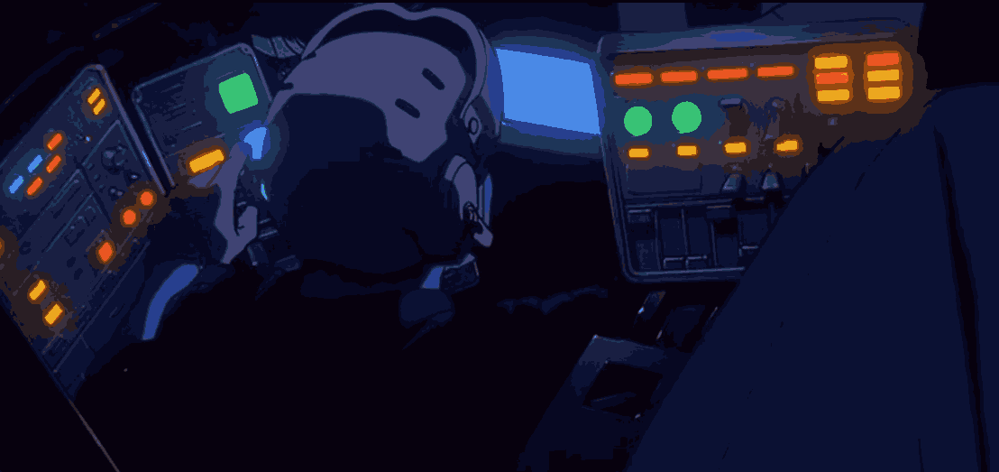

In [29]:
compress_image('./media/Screenshot 2024-05-15 162001.png', 15)

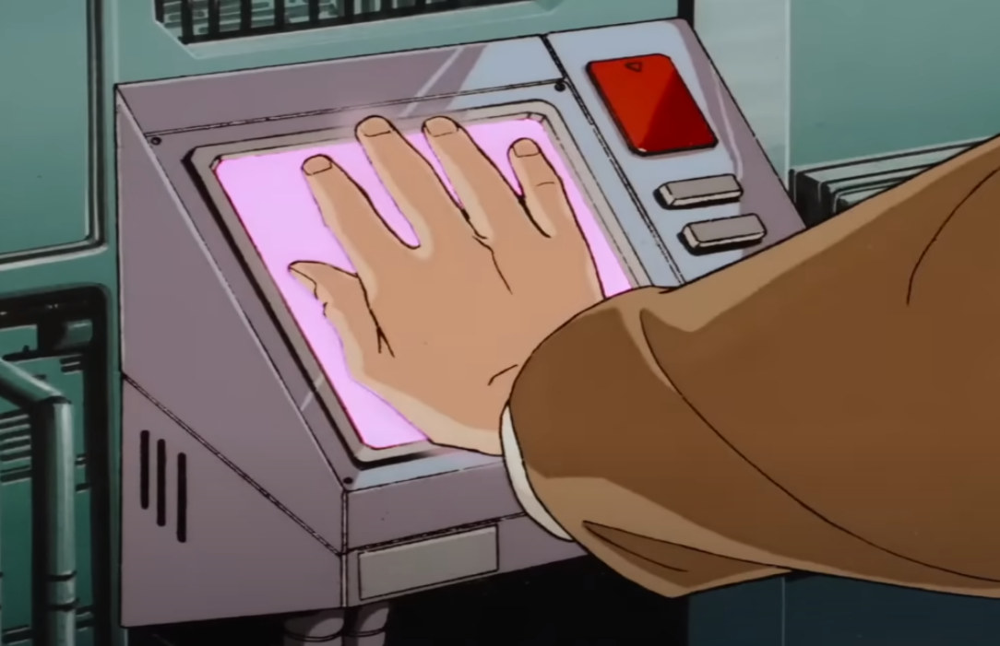

RGBA (1084, 701)
Pixels 3D chart original image


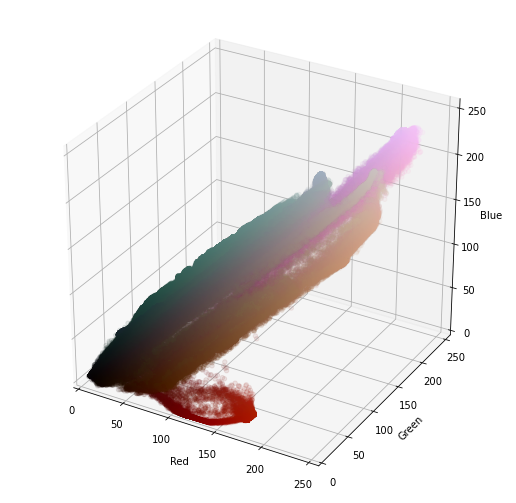

fitting model
compressing the image
Pixels 3D chart compressed image 15 clusters


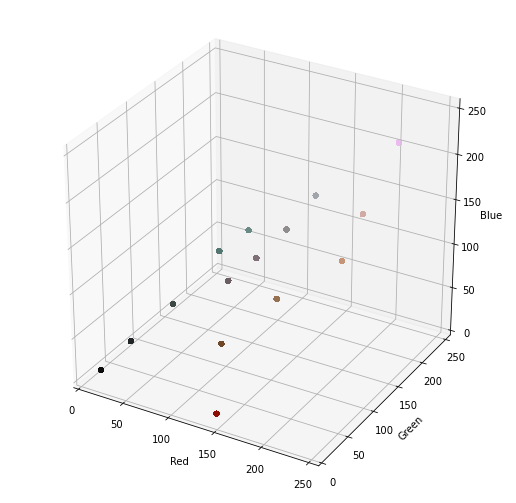

Pallete


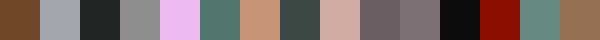

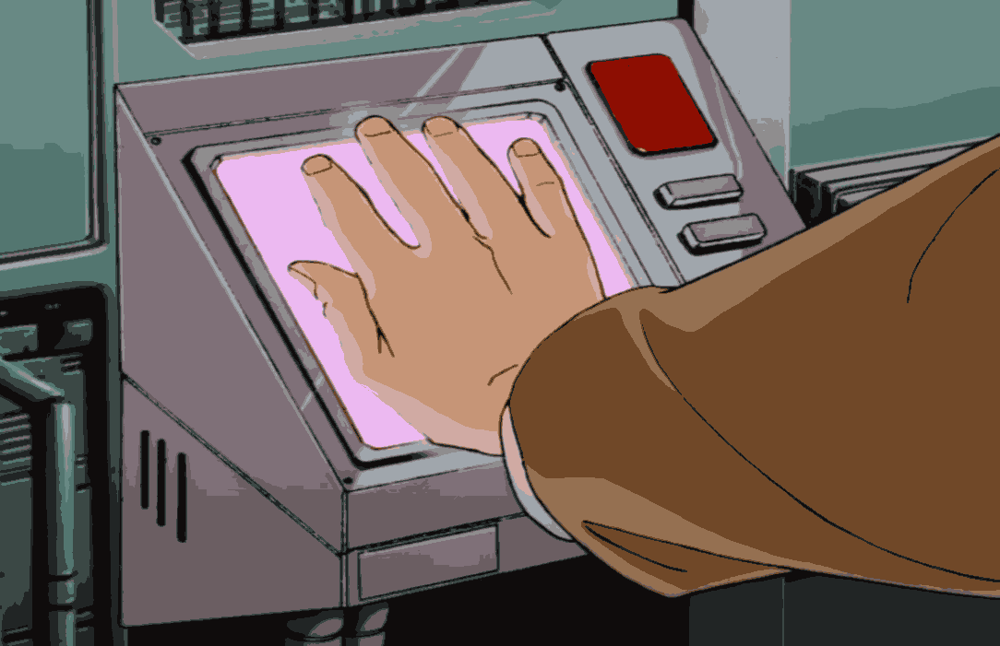

In [30]:
compress_image('./media/Screenshot 2024-05-15 174513.png', 15)

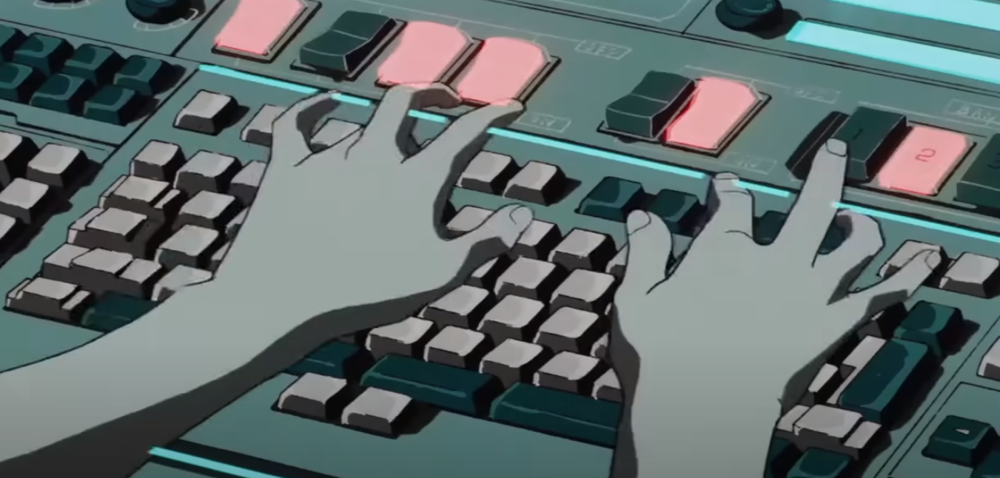

RGBA (1351, 646)
Pixels 3D chart original image


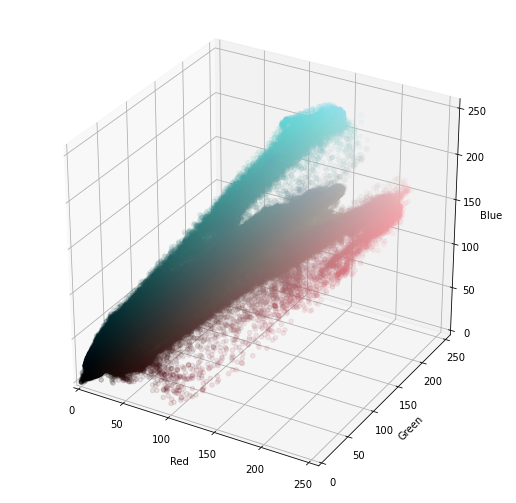

fitting model
compressing the image
Pixels 3D chart compressed image 12 clusters


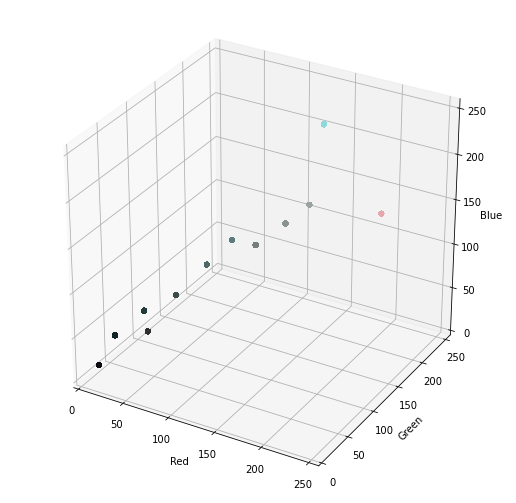

Pallete


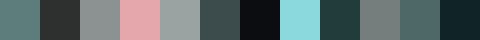

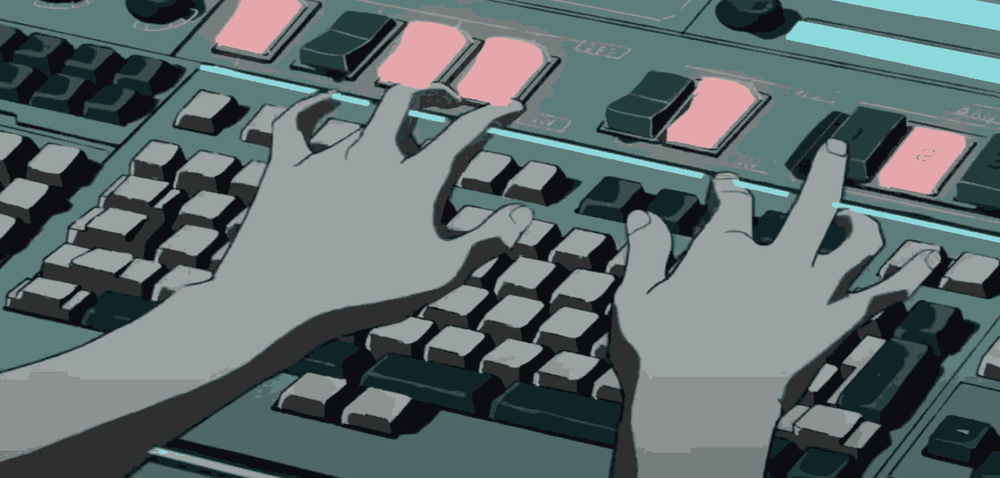

In [35]:
compress_image('./media/Screenshot 2024-05-15 174535.png', 12)

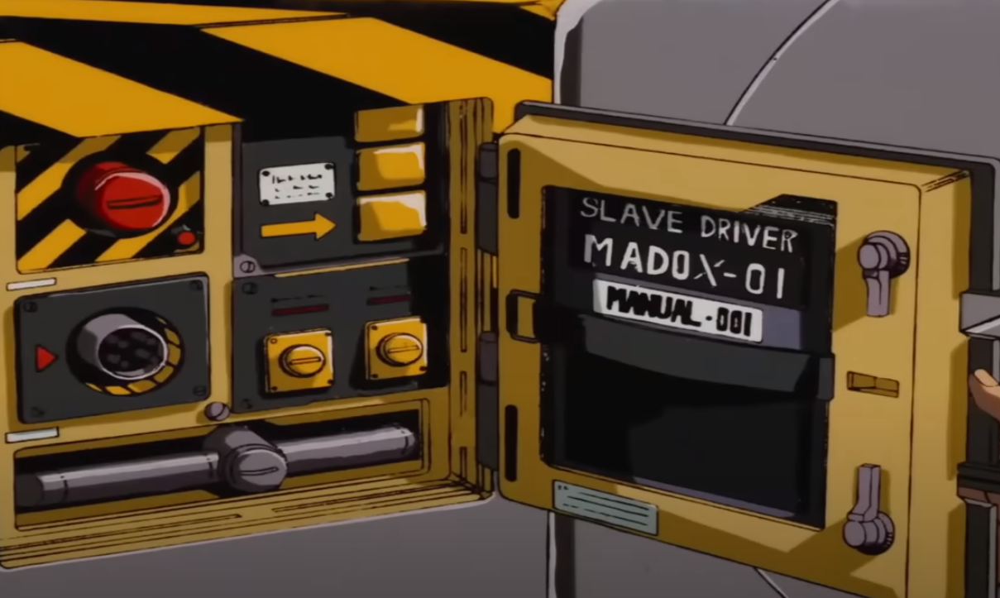

RGBA (1209, 723)
Pixels 3D chart original image


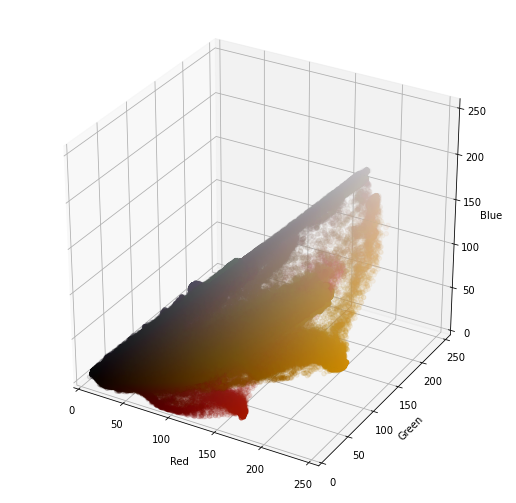

fitting model
compressing the image
Pixels 3D chart compressed image 15 clusters


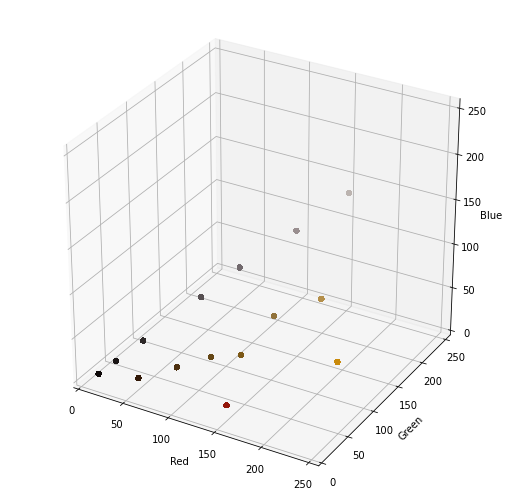

Pallete


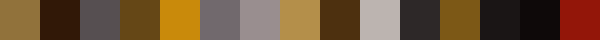

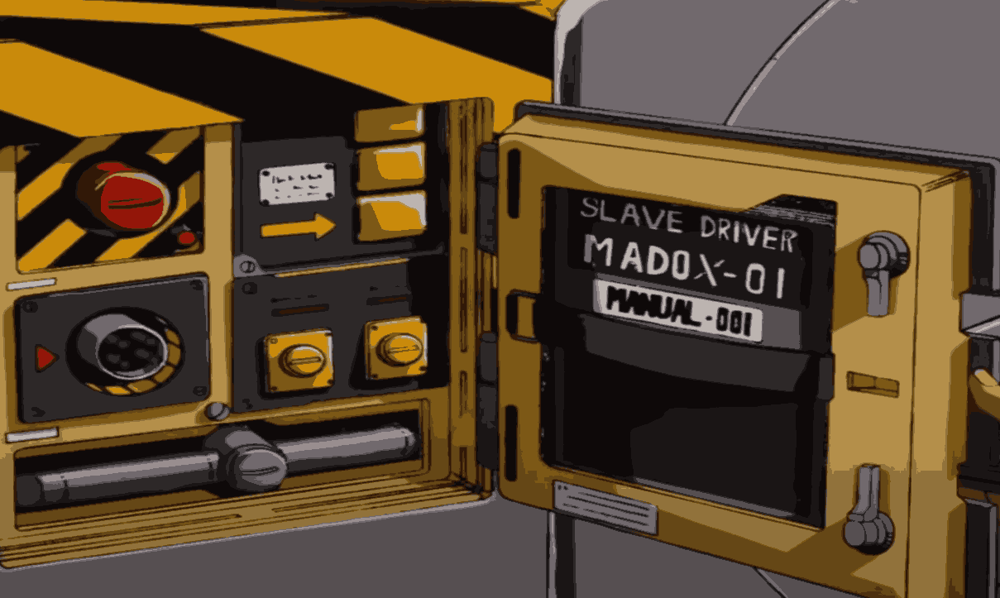

In [32]:
compress_image('./media/Screenshot 2024-05-15 174555.png', 15)

### Pallet size

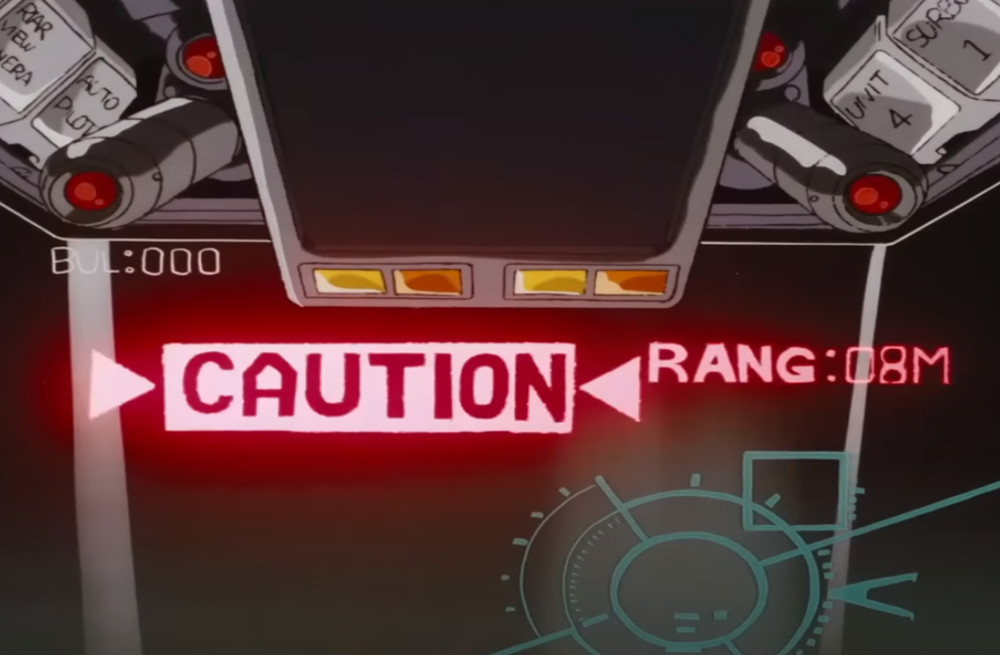

RGBA (1087, 712)
Pixels 3D chart original image


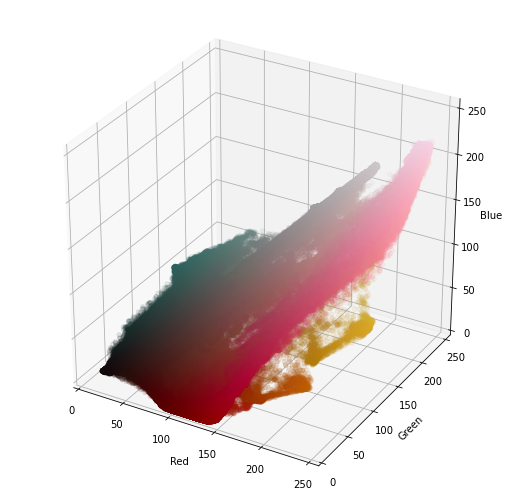

fitting model
compressing the image
Pixels 3D chart compressed image 15 clusters


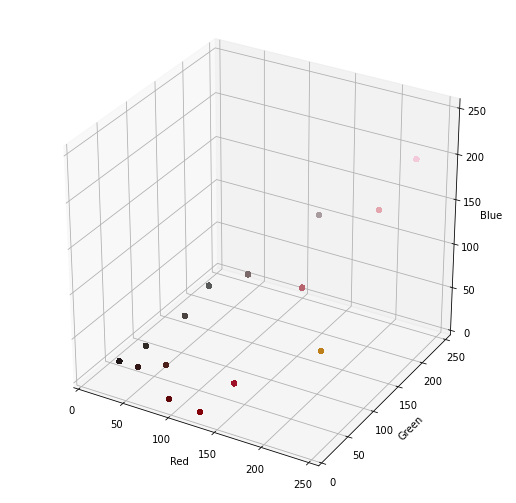

Pallete


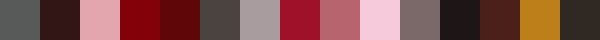

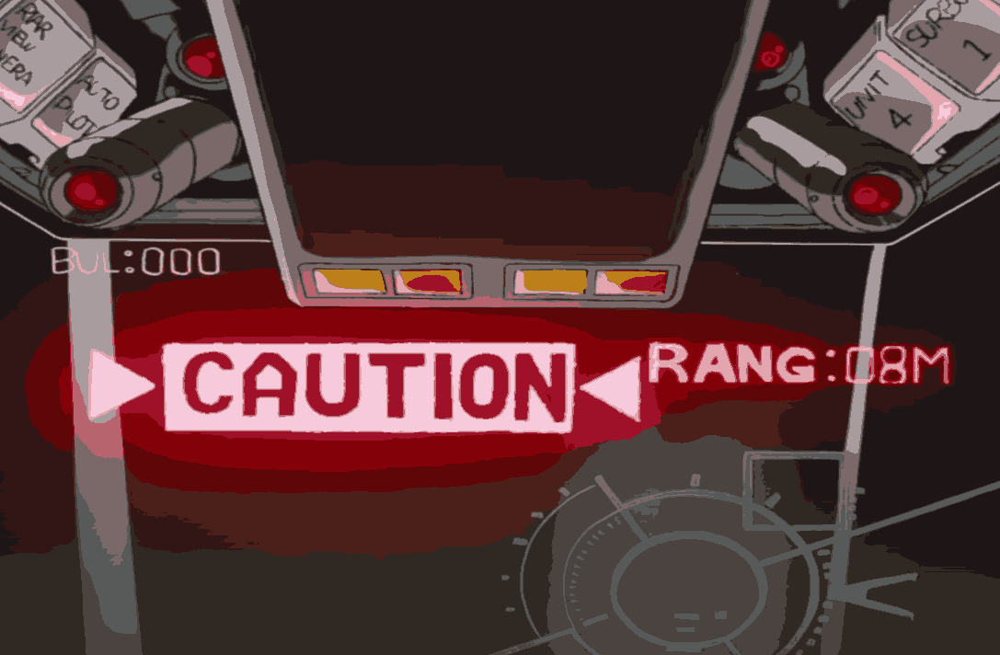

In [34]:
compress_image('./media/Screenshot 2024-05-15 174709.png', 15)

### Pallet size

In [ ]:
palet_len=6

Cluster the image data

In [ ]:
kmean=KMeans(palet_len, n_jobs=cpu_threads)

# copy pixel data
data = np.asarray(img.getdata())

# fix the kmean
kmean.fit(data)

# assig each pixel to cluster
imgclust=kmean.predict(data)

# reshape data for easier access in copy process

In [ ]:
imgclust=imgclust.reshape((img.size[1],img.size[0]))
imgclust

### Create Palette

In [ ]:
palette=np.vectorize(int)(kmean.cluster_centers_)

palette=[tuple(p)for p in palette]

In [ ]:
palette_height=40

img_palette=Image.new(img.mode, (palet_len*palette_height, palette_height))
pix_palette=img_palette.load()

for x in range(img_palette.size[0]):
    for y in range(img_palette.size[1]):
        pix_palette[x,y]=palette[x//palette_height]

img_palette

In [ ]:
treed__pixel_chart(np.take(palette, imgclust, axis=0), 'Pixels 3D chart compressed image', alpha=0.1)

### Compressed Image

In [ ]:
for x in range(img.size[0]):
    for y in range(img.size[1]):
        pix[x,y]=palette[imgclust[y][x]]


img

In [ ]:
print(not True)

### Original Images
![Original](image1.jpg)


In [ ]:
compress_image("image1.jpg", 8)

In [ ]:
compress_image("image1.jpg", 3, skip_3d_original=True)

### Original Images 2
![Original](image2.jpg)


In [ ]:
compress_image("image2.jpg", 8)

In [ ]:
compress_image("image2.jpg", 40, skip_3d_original=True)

### Original Images 3
![Original](image3.jpg)


In [ ]:
compress_image("image3.jpg", 7)

In [ ]:
compress_image("image3.jpg", 24, skip_3d_original=True)

In [ ]:
compress_image("image3.jpg", 40, skip_3d_original=True)

### Original Images

sRGB (standard Red Green Blue) is an RGB color space that HP and Microsoft created cooperatively in 1996 to use on monitors, printers, and the Web. It was subsequently standardized by the IEC as IEC 61966-2-1:1999.[1] It is often the "default" color space for images that contain no color space information, especially if the images' pixels are stored in 8-bit integers per color channel.


![Original](image4.png)


In [ ]:
compress_image("image4.png", 8)

In [ ]:
compress_image("image4.png", 16, skip_3d_original=True)

In [ ]:
compress_image("image4.png", 42, skip_3d_original=True)

In [ ]:
compress_image("image4.png", 128, skip_3d_original=True)

### Original Image 5
![Original](image5.jpg)

In [ ]:
compress_image("image5.jpg", 3)

In [ ]:
compress_image("image5.jpg", 8, skip_3d_original=True)

In [ ]:
compress_image("image5.jpg", 30, skip_3d_original=True)

In [ ]:
compress_image("image6.jpg", 42)